# AI in Healthcare

Brain tumor detection and semantic segmentation using Deep Learning.

As one might be aware, AI has stepped foot in almost every aspect of one's day to day life. Healthcare is no different. From chronic diseases to risk assessment, there are nearly endless opportunities in healthcare to leverage AI and technology to deploy more efficient and prompt solutions and treatments 

Ai significantly reduces the time taken to detect and also diagnose most kinds of diseases and medical conditions.

We recently witnessed such a feat, where AI helped health and science experts take a huge step forward in answering the long standing complex questions about protein folding in humans.

For more on the story, visit https://www.nature.com/articles/d41586-019-01357-6

Moreover, using AI, we are able to match and sometimes even surpass the insights of experts in the medical field.While this might be wrongly understood by some, as some way of mass replacement medical staff and doctors, that is not necessarily the case

Since, this is a field that concerns the life of patients, there is no harm in being absolutely sure about a patient's medical condition and its diagnosis by additionally leveraging technology and AI

One such medical task is detecting Brain tumor in humans and isolating the exact affected location in the brain

Recently, AI has been employed by many, to provide better insights in that regard and it has proved very helpful in providing quicker and better treatment

https://www.thebraintumourcharity.org/media-centre/news/research-news/artificial-intelligence-improves-brain-tumour-diag/


https://www.cancer.gov/news-events/cancer-currents-blog/2020/artificial-intelligence-brain-tumor-diagnosis-surgery

One such way is to feed a Deep Learning system, data about previous medical records of patients such as Brain MRI scans, and coming up with an efficient model that can perform the task of detecting and segmenting out brain tumor.

We shall try to perform a similar task

# Problem Definition:

Given MRI scan images of human brains that both contained and did not contain brain tumor, we want to build an AI pipeline that performs the task of predicting if the patient has brain tumor and if so visually show the tumor region by semantic segmentation.

## Imports

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize  
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score,precision_score,recall_score
import os
import glob
import random
import plotly.graph_objects as go
from google.colab import files #library to upload files to colab notebook
%matplotlib inline

# Approach:
Detection:
We will first build and train a model to detect Brain Tumor from the MRI scans.
The model must be able to classify a given sample(MRI) as tumor positive or negative.

Semantic Segmentation:
Then we build and train a model to produce the segmented(mask) image given the MRI scan image of a tumor positive sample. 


We will then put the two models together in a prediction pipleline.

# Data:
We make use of data available in the Kaggle task - LGG(Lower Grade Glioma) segmentation.

The dataset is available at https://www.kaggle.com/mateuszbuda/lgg-mri-segmentation

One could also download the data locally and the use it for this task.

Before we proceed to the next stages, it is important that we familiarize ourselves with some medical terms that we will come across often in this task

* **MRI** : It is a medical imaging technique which uses string magnetic fields and radio waves to generate images of the required regions of the body(in this case the human brain)

* Glioma : It is just another term(actually a type) of Brain tumor.This kind of brain tumor is often but not always malignant.So we get an idea of the importance of making the right prediction during detection.


Brain tumors are **graded on a scale of 1 to 4**, based on how malignant, or cancerous, they are – that is, how abnormal their cells appear under a microscope. **A grade of 1 is the least malignant, and 4 is the most malignant**. <i>A tumor may contain cells of different grades, but it is classified by its highest-grade cells.</i>

Grades are often assigned to gliomas, which are tumors that develop in the supporting glial cells of the brain or spine. Gliomas make up about 30 percent of all brain and central nervous system tumors, and about 80 percent of all malignant brain tumors.

The dataset also contains mask images(a grayscale image with just foreground background pixels) indicating the region of tumor(if present) in the brain.Those segmented images have been obtained after passing the MRI images through the FLAIR technique.

* FLAIR : It is a process where the effect of certain fluids in the brain on the MRI scan are suppressed, so as to get a better view of the crucial  regions of the brain.

We are provided with the scanned images of the MRI scan taken during different times of 110 patients and the information on if they have(had) brain tumor(low grade glioma) or not.We are also provided with corresponding images wherein the tumor region is masked out.

<h3>Why only low grade glioma?</h3>

 * Low-grade gliomas grow very slowly, but are still malignant and **can progress to high-grade gliomas if left untreated**. 
 * However, **treatment can be very effective for low-grade glioma**. Surgeons can often remove an entire tumor with no need for follow-up treatment, and the prognosis is typically favorable.
 * It may be slightly easier to detect high grade glioma since those tumor cells will be abnormal-looking cells and may lack normal tissue structures.("Poorly differentiated").

## Importing the data from Kaggle:

In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


Create a folder to import the data(extract)

In [ ]:
! mkdir data/brain_scans

mkdir: cannot create directory ‘data/brain_scans’: File exists


Install Kaggle using pip

In [ ]:
! pip install -q kaggle

Create and download the API token from Kaggle and upload it here.

In [ ]:
from google.colab import files

In [ ]:
files.upload()       

Create a root folder named 'kaggle' and move the uploaded file there.

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/  

Set permission for the file

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

Download the dataset by providing the kaggle dataset link

In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation

Unzip the downloaded dataset to the folder we created, to persist the data.Else the data will become unavailable once the runtime ends.

In [ ]:
!unzip lgg-mri-segmentation.zip -d data/brain_scans/

## Reading in the data

The 'data_mask.csv' file contains information about the paths of the MRI and mask images for each sample.

This can easily be obtained by processing the 'data.csv' file that comes as a part of the data and located in "/content/drive/My Drive/data/brain_scans/lgg-mri-segmentation/kaggle_3m/data.csv".

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/data/brain_scans/files/data_mask.csv")

In [ ]:
data 

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


There are no empty cells in the data.

<h3>What does each column represent?</h3>

* The first column is the **patient id**, which is useful for identification purposes, but **doesn't serve any purpose during modelling.**

* The second column contains the **filename of the corresponding scan image** as as string(object).

* The **third column** 'mask' contains information as to whether the mask image for each sample contains any foreground pixels, which serves as an indicator to **whether the sample has tumor or not.**

  If tumor is present, the mask image will have Foreground pixels(white region).

<b>Person did not have Brain tumor - Mask image is completely black - Mask column has a value of 0

Person had Brain tumor         - Mask image has some white(or gray) region(s) - Mask column has a value of 1 </b>

Since the name of the 3rd column is not easily interpretable , we shall change it to something more easily comprehensible such as 'tumor',

 wherein 0 indicates 'No' and 1 indicates 'Yes'

In [ ]:
data['tumor'] = data['mask']
data.drop(labels='mask', axis =1,inplace=True)
data.head()

,patient_id,image_path,mask_path,tumor
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [ ]:
data

,patient_id,image_path,mask_path,tumor
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


## Comparing the contribution by different target classes.

We'll compare the contribution from each target class(tumor positive or negative), by plotting the number of samples from each class.

In [ ]:
df_copy = data.copy()


fig = go.Figure([go.Bar(x=df_copy['tumor'].value_counts().index.sort_values(ascending=False),
                        y=list(df_copy['tumor'].value_counts())[::-1])])
fig.update_traces(marker_color=('rgb(200,0,0)', 'rgb(0,200,0)'), marker_line_color = ('rgb(255,0,0)', 'rgb(0,255,0)'),
                  marker_line_width=7, opacity=0.6)
fig.show()

We see that our dataset contains samples of people who did not have brain tumor more than people who did.

In [ ]:
data['tumor'].value_counts() / len(data) * 100

0    65.054721
1    34.945279
Name: tumor, dtype: float64

Images of people who did not have tumor constitutes 65% of our data 

Due to the imbalance in the dataset in distribution of target classes, we have to account for it while training the detector model.

## Let us explore the features in the data

In [ ]:
data['mask_path']

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [ ]:
data['image_path']

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: image_path, Length: 3929, dtype: object

### Updating paths to be absolute

We see that, the image paths and the mask paths are relative.

Since we have downloaded and unzipped the data to our drive, we need to specify the correct absolute paths in order to retrieve the image files

In [ ]:
df_copy['image_path'] = df_copy['image_path'].apply(lambda x: f"/content/drive/MyDrive/data/brain_scans/files/{x}")

In [ ]:
df_copy['mask_path'] = df_copy['mask_path'].apply(lambda x: f"/content/drive/MyDrive/data/brain_scans/files/{x}")

In [ ]:
df_copy['mask_path'][0]

'/content/drive/MyDrive/data/brain_scans/files/TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_mask.tif'

In [ ]:
df_copy['image_path'][0]

'/content/drive/MyDrive/data/brain_scans/files/TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif'

Now that we have updated the paths correctly, we shall try and visualize our data

## Visualizing our data

We will be using **Open CV** ans **skimage** to read images and **matplotlib** to plot images.

Since Open CV by default assumes images to be in *BGR* color format, we need to convert it to *RGB* colour format before using matplotlib to plot them.

We will define a utility function that makes this process easier

In [ ]:
def cv_read_img(img_path):
  return cv2.cvtColor(cv2.imread(img_path),cv2.COLOR_BGR2RGB)

In [ ]:
# Let us visualize a random brain scan image and its mask, while also testing the utility function we defined

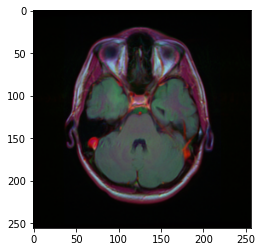

In [ ]:
plt.imshow(cv2.imread(df_copy['image_path'][619]))     # OpenCV Default 

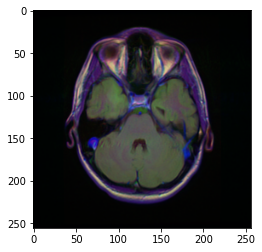

In [ ]:
plt.imshow(cv_read_img(df_copy['image_path'][619]))     # Using the utility function

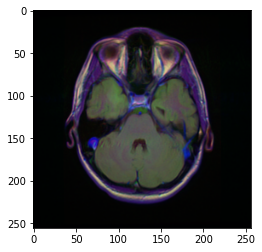

In [ ]:
plt.imshow(io.imread(df_copy['image_path'][619]))      # Using skimage

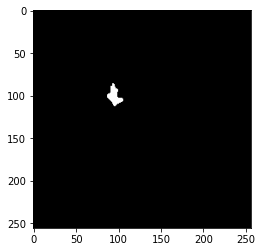

In [ ]:
plt.imshow(cv_read_img(df_copy['mask_path'][619]))

Everything works fine and we are able to properly access the stored images.

### Bigger and better visualizations of our data

Let us try to visualize the MRI scan and masked image together(side by side) of several samples at once.

In [ ]:
def visualize_scans_and_masks(data=data, samples=6):
  """
  Takes in number of samples to visualize and plots data of randomly chosen images from data
  """
  fig,axs = plt.subplots(samples,2,figsize=(samples * 3 , samples * 6))
  count = 0
  label_map = {0:'No Tumor', 1:'Tumor'}
  FONT_SIZE = 16
  
  for _ in range(samples):
    choice = random.randint(0,len(data))       # choose a random index
    
    # LHS
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].title.set_fontsize(FONT_SIZE)
    axs[count][0].imshow(cv_read_img(data.image_path[choice]))
    
    # RHS
    axs[count][1].title.set_text(f'{label_map.get(data.tumor[choice])}')
    axs[count][1].title.set_fontsize(FONT_SIZE)
    axs[count][1].imshow(cv2.imread(data.mask_path[choice]))

    count += 1

  fig.tight_layout()


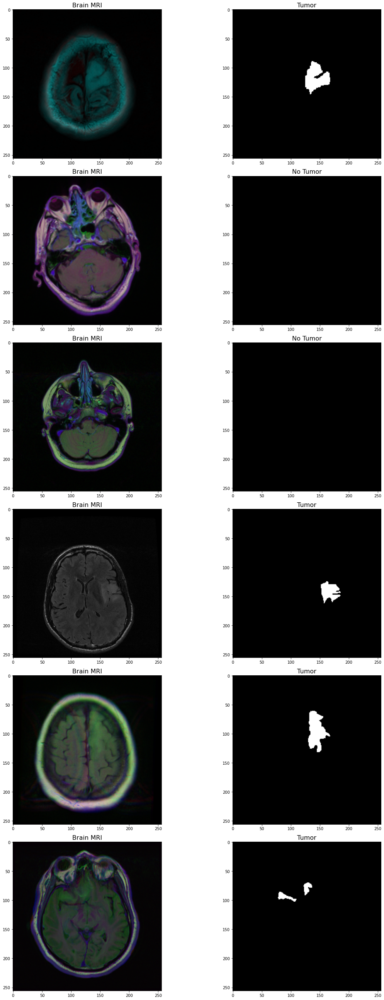

In [ ]:
visualize_scans_and_masks(df_copy, 6)

While the above visualization looks good, it would also be nice to view the masked region mapped onto the actual scan image

In [ ]:
def visualize_scans_with_masks(data=data, samples=6):
  """
  Takes in number of samples to visualize and plots data and mapped mask images of randomly chosen images from data
  """
  fig,axs = plt.subplots(samples, 3, figsize=(samples * 3 , samples * 9))
  count = 0
  label_map = {0:'No Tumor', 1:'Tumor'}
  FONT_SIZE = 26
  
  for _ in range(samples):
    choice = random.randint(0,len(data))       # choose a random index
    
    # Col 1 : Brain Scans
    scan = io.imread(data.image_path[choice])
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].title.set_fontsize(FONT_SIZE)
    axs[count][0].imshow(scan)
    
    # Col 2 : Masked images
    mask = io.imread(data.mask_path[choice])
    axs[count][1].title.set_text(f'{label_map.get(data.tumor[choice])}')
    axs[count][1].title.set_fontsize(FONT_SIZE)
    axs[count][1].imshow(mask, cmap='gray')

    # Col 3: Mapping masked regions onto original scan image
    scan[mask == 255] = (255, 0, 0)      # We set pixel values in mapped region to pure red
    axs[count][2].title.set_text('MRI with Mask')
    axs[count][2].title.set_fontsize(FONT_SIZE)
    axs[count][2].imshow(scan)

    count += 1


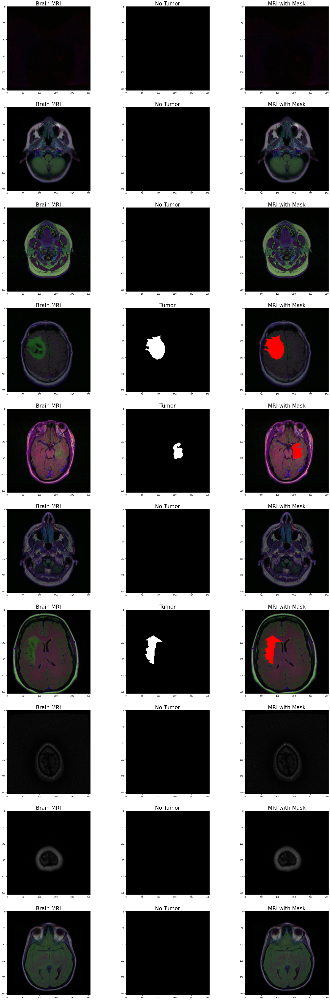

In [ ]:
visualize_scans_with_masks(df_copy, samples=10)

## Splitting the data

We shall split the data into 3 - Train, Validation and Test splits

Since, only the filepaths and not the actual images are avaialble in the dataframe,
we shall load the images into memory while also splitting them, using the ImageDataGenerator from Keras.

* We also must perform normalization on our image data.

* We no longer need the patient-id feature.

* We also do not need the Mask image for tumor **detection**, but however we shall use it during **segmentation**.

* We need to perform some sort of encoding on the image labels(target values).

In [ ]:
df_copy = df_copy.drop(columns=['patient_id'])

In [ ]:
# Also since Tensorflow expects the label to be in either string, list or tuple format, we choose to feed labels as strings this time.
# We could also provide encoded labels to the model, if needed.
df_copy['tumor'] = df_copy['tumor'].apply(lambda x: str(x))
df_copy.head()

,image_path,mask_path,tumor
0,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0
1,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0
2,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0
3,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0
4,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0


First split into Training and Test sets

In [ ]:
train_mri_data,test_mri_data = train_test_split(df_copy, test_size = 0.15, random_state=42)

In [ ]:
print(train_mri_data.shape, test_mri_data.shape)

(3339, 3) (590, 3)


We still need to split the train_mri_data into separate training and validation splits.

We shall specify that during the ImageData Generator instantiation.

## Data generator for Training and Valdation

The image paths will be passed from the dataframe

In [ ]:
# For training and validation

datagen = ImageDataGenerator(rescale=1./255., validation_split=0.1)      # Scaling the image

# 10% of training data kept as validation data

train_generator = datagen.flow_from_dataframe(train_mri_data,
                                              directory='./',
                                              x_col='image_path',
                                              y_col='tumor',
                                              subset='training',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )
valid_generator = datagen.flow_from_dataframe(train_mri_data,
                                              directory='./',
                                              x_col='image_path',
                                              y_col='tumor',
                                              subset='validation',
                                              class_mode='categorical',
                                              batch_size=16,
                                              shuffle=True,
                                              target_size=(256,256)
                                             )


Found 3006 validated image filenames belonging to 2 classes.
Found 333 validated image filenames belonging to 2 classes.


## Data Generator for Testing

In [ ]:
# For testing

test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_dataframe(test_mri_data,
                                                  directory='./',
                                                  x_col='image_path',
                                                  y_col='tumor',
                                                  class_mode='categorical',
                                                  batch_size=16,
                                                  shuffle=False,
                                                  target_size=(256,256)
                                                 )


Found 590 validated image filenames belonging to 2 classes.


# Model to detect Brain Tumor:

First, we shall train a model to detect Brain Tumor.

We will be using the ResNet50 model for this task.

For detailed information regarding history and architecture of ResNet and its variations, refer these links:

https://towardsdatascience.com/an-overview-of-resnet-and-its-variants-5281e2f56035

https://www.geeksforgeeks.org/residual-networks-resnet-deep-learning/


Briefly,

<h3><b>ResNets:</b></h3>

* In complex neural networks, as we increase the number of layers, the common problem of **'Vanishing Gradients'** is encountered.Here, the gradients tend to become very small, and the weights hardly change after updation.
Thus the **training and test error rate increase with increase in number of layers.**

* To solve this problem, the ResNet architecture was proposed, containing **skip connections** within the model.

* The benefit of using Skip Connections is, as the model learns, if some layer hurts the performance, the model can choose to skip that layer of weights(usually convolutions).

* This helps in dealing with the problem of Vanishing Gradients.

<img src="https://miro.medium.com/max/510/1*ByrVJspW-TefwlH7OLxNkg.png"/>


<h3><b>ResNet Architecture:</b></h3>

* As of now, there are many variations of ResNet architecture differing by the order which convolutions,normalizing and activations are performed on the input data.
* ResNet50 is a variant of ResNet model which has 48 Convolution layers along with 1 MaxPool and 1 Average Pool layer
* In this variant, **in every stage, the input proceeds in two paths, the main path and the skip path.**
* In main path, input goes through a series of processing such as convolutions, normalizations and activations.
* We concatenate the outputs from main path and skip path and send to the next stage.
* In order for both those outputs to be concatenated, they must be of the same shape(volume).
* If they are indeed same, then the input need not go through any transformation in the skip path(Identity Block).

<img src="https://miro.medium.com/max/875/1*uyXEvYztiv3fGGCCPbm8Jg.png"/> 

* If not, we perform one convolution(and normalization) on the input in the skip path.(Convolutional Block)

<img src="https://miro.medium.com/max/875/1*U5wkA4O1IpY-ekXqFh0tUQ.png"/>


<h3><b>ResNet 50: </b></h3>

<img src="https://www.researchgate.net/publication/331364877/figure/fig3/AS:741856270901252@1553883726825/Left-ResNet50-architecture-Blocks-with-dotted-line-represents-modules-that-might-be.png"/>


Although we can build the ResNet50 model from scratch, it is better to use the ResNet50 model pretrained on the ImageNet dataset, provided by Keras.

https://keras.io/api/applications/resnet/#resnet50-function

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50
clf_model = ResNet50(weights='imagenet', include_top=False, input_tensor=Input(shape=(256,256,3)))
clf_model.summary()

94773248/94765736 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
__________________________

Since we'll be adding **some custom layers at the end of the ResNet50 model to make it suit our task**, we'll call the Resnet model as clf_model for now

Now there are two options:

* We could use the pre-trained weights as they are, by specifying them as "Non-Trainable" and training only the custom layers we add  

  (or)

* We could update the pre-trained weights by training them further, but with a small learning rate, so as to not make any big changes in the model weights.The model has been trained rigorously on huge amounts of data, so it's weights will be pretty good.

We choose not to train the model's weights any further and set them to 'Non Trainable'

In [ ]:
for layer in clf_model.layers:
    layers.trainable = False

## Adding custom layers to the model

In [ ]:
x = clf_model.output

x = AveragePooling2D(pool_size=(4,4))(x)
x = Flatten(name='Flatten')(x)

x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)

x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)

x = Dense(2, activation='softmax')(x)           # since there are 2 target classes
  
model = Model(clf_model.input, x)

# Compile the model
model.compile(loss = 'categorical_crossentropy', 
              optimizer='adam', 
              metrics= ["accuracy"]
             )

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

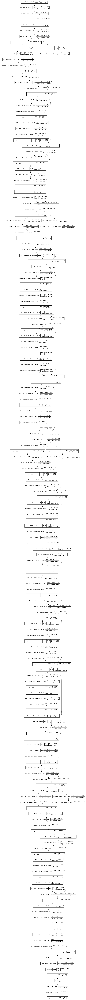

In [ ]:
plot_model(model,to_file='/content/drive/My Drive/files/tumor_detector_model_arch.png',show_shapes=True,
           show_dtype=True,expand_nested=True)

## Defining model callbacks:

Early Stopping - For stopping the model from overfitting the data, when validation loss hasn't decreased for quite some time during training.

Checkpoint     - To save the weights of the model when the (validation) loss is lowest.

In [ ]:
earlystopping = EarlyStopping(monitor='val_loss', 
                              mode='min', 
                              verbose=1, 
                              patience=15     # waits for 15 epochs to stop training, when val loss hasn't decreased
                             )
save_best = ModelCheckpoint(filepath="/content/drive/MyDrive/models/min_val_loss-brain-tumor-classifier-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True
                              )

Training the Brain Tumor Detector Module

In [ ]:
h = model.fit(train_generator, 
              epochs = 50, 
              validation_data= valid_generator, 
              callbacks=[save_best, earlystopping])

Epoch 1/50
188/188 [==============================] - 46s 238ms/step - loss: 0.5052 - accuracy: 0.8277 - val_loss: 0.6397 - val_accuracy: 0.6620

Epoch 00001: val_loss did not improve from 0.47384
Epoch 2/50
188/188 [==============================] - 45s 238ms/step - loss: 0.3571 - accuracy: 0.8606 - val_loss: 0.8783 - val_accuracy: 0.6620

Epoch 00002: val_loss did not improve from 0.47384
Epoch 3/50
188/188 [==============================] - 45s 240ms/step - loss: 0.2664 - accuracy: 0.8945 - val_loss: 0.7175 - val_accuracy: 0.6660

Epoch 00003: val_loss did not improve from 0.47384
Epoch 4/50
188/188 [==============================] - 45s 241ms/step - loss: 0.3504 - accuracy: 0.8663 - val_loss: 0.5946 - val_accuracy: 0.8040

Epoch 00004: val_loss did not improve from 0.47384
Epoch 5/50
188/188 [==============================] - 45s 241ms/step - loss: 0.2361 - accuracy: 0.9128 - val_loss: 0.2579 - val_accuracy: 0.9080

Epoch 00005: val_loss improved from 0.47384 to 0.25789, saving mod

As we can see, since the validation loss did not decrease for a significant number of epochs(15), the training has been stopped prior to the specified number of epochs.

And also, the weights of the model version with least validation loss has been stored in the specified location.

## Saving the model

Use the builtin save function within tensorflow.models.

In [ ]:
model.save("/content/drive/MyDrive/models/tumor_classifier_model")

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



INFO:tensorflow:Assets written to: /content/drive/MyDrive/models/tumor_classifier_model/assets


## Load the saved model

In [ ]:
loaded_custom_tumor_detector = load_model('/content/drive/MyDrive/models/tumor_classifier_model')

## Evaluate model performance

In [ ]:
from sklearn.metrics import accuracy_score,f1_score,precision_score,recall_score

## Performance of Saved Model

In [ ]:
test_preds = loaded_custom_tumor_detector.predict(test_generator,verbose = 1) 

# We need to extract the class with highest prediction confidence for each sample
pred_classes = [] 
for i in test_preds: 
  pred_classes.append(str(np.argmax(i)))
pred_classes = np.asarray(pred_classes)


# Also extract ground truth values to evaluate model perfomance on test data
true_classes = np.asarray(test_mri_data['tumor'])


# Get the accuracy of model predictions
detector_accuracy = accuracy_score(true_classes, pred_classes)
print("Accuracy of detection is ",detector_accuracy)

# Get the precision,recall and f1_score
from sklearn.metrics import classification_report

report = classification_report(true_classes, pred_classes, labels = [0,1])
print(report)

37/37 [==============================] - 5s 139ms/step
Accuracy of detection is  0.9694915254237289
              precision    recall  f1-score   support

           0       0.96      0.99      0.98       366
           1       0.99      0.93      0.96       224

   micro avg       0.97      0.97      0.97       590
   macro avg       0.97      0.96      0.97       590
weighted avg       0.97      0.97      0.97       590



/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:576: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



### Note on Model Performance Evaluation:

As Brain Tumor is a very serious health concern, the importance of proper evaluation of the model's performance cannot be stressed enough

We not only care about accuracy here, but also the precision and recall metrics.

Precision - Out of the patients the model predicted as Having Brain Tumor, how many actually had it?

Recall    - Out of all patients who actually had Brain Tumor, how many was our model able to identify?

We do not want to just focus on improving accuracy and neglect other metrics.

Eg: A very low recall value, even when accuracy is reasonable means, even if model is good at detecting absence of Brain tumor in people, the model may fail to identify many people who actually have Brain tumor.We for sure do not want that.

## Checkpointed Model Performance

We saw the performance of the saved model, we'll also take a look at the how the checkpointed model(with minimum validation loss) performs.

For that, we need just the architecture(skeleton) of the saved model, without the weights, since we intend to use the checkpointed model weights.

### Save the model architecture

In [ ]:
model_json = model.to_json()
with open("/content/drive/MyDrive/models/tumor_classifier_model_arch.json","w") as json_file:
  json_file.write(model_json)

### Load the model architecture and set new weights

In [ ]:
with open('/content/drive/MyDrive/models/tumor_classifier_model_arch.json', 'r') as json_file:
    json_savedModel= json_file.read()


best_model1 = tf.keras.models.model_from_json(json_savedModel)
best_model1.load_weights("/content/drive/MyDrive/models/min_val_loss-brain-tumor-classifier-weights.hdf5")

### Evaluate performance

In [ ]:
best_test_preds = best_model1.predict(test_generator,verbose = 1) 
best_pred_classes = [] 
for i in best_test_preds: 
  best_pred_classes.append(str(np.argmax(i)))
best_pred_classes = np.asarray(best_pred_classes)


accuracy = accuracy_score(true_classes, best_pred_classes)
print("Accuracy is ",accuracy)

rep = classification_report(true_classes,best_pred_classes, labels=[0,1])
print(rep)

37/37 [==============================] - 6s 138ms/step
Accuracy is  0.9559322033898305
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       366
           1       0.97      0.91      0.94       224

   micro avg       0.96      0.96      0.96       590
   macro avg       0.96      0.95      0.95       590
weighted avg       0.96      0.96      0.96       590



/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:576: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



As we can see the checkpointed model's performance is very similar to the saved model.

Both achieve a good level of accuracy in detecting Brain Tumor.

# Adjusted Detector Model:

We were able to attain  **reasonably good accuracy** with the above detector model.

**Is that it?**

Certainly not.Even though the model's accuracy is pretty high, looking at the classification report, we see that the **recall value**(for class 1  <b>i.e tumor positive) **is pretty low**(0.91).</b>

While this may seem to be a pretty good value, detecting Brain Tumor is a **serious health concern**, and therefore we want the model recall value to be as high as possible.(Must identify as many tumor positive samples as possible out of samples that actually have tumor).



So we need to focus more on the model recall.

**Why is it low?**

 * One reason for this could be the imbalance in the dataset.
  
 * Since there are more samples from tumor negative class,the model might tend to have a high recall only for that class.
  
**We need to account for this imbalance in distribution of target classes**.

**But how do we quantify this imbalance?**

  * For making the model aware of such an imbalance, the training function in keras has a parameter called class_weight.

  * <b>If the class weight is specified as [1,3] for classes 0 and 1, then the model treats every instance of class 1 as 3 instances of class 0.</b> 

  * The class_weights can be calculated from the data using the sklearn utility function called class_weight.


In [ ]:
from sklearn.utils import class_weight

In [ ]:
# Note: keras expects the class_weight to be in the form of a dictionary
class_weights = dict(zip(np.unique(train_mri_data['tumor']), class_weight.compute_class_weight('balanced', np.unique(train_mri_data['tumor']), 
                train_mri_data['tumor']))) 
class_weights[0] = class_weights['0']
class_weights[1] = class_weights['1']

class_weights.pop('0')
class_weights.pop('1')

class_weights

{0: 0.7623287671232877, 1: 1.4530026109660574}

And also, we will set Recall to be the metric of the model, since that is the metric we want to use to compare different models.

## Model compilation and Defining callbacks:

In [ ]:
model2 = Model(clf_model.input, x)

In [ ]:
model2.compile(loss = 'binary_crossentropy', 
              optimizer='adam', 
              metrics= [tf.keras.metrics.Recall()]       # recall is the metric
             )

In [ ]:
earlystopping = EarlyStopping(monitor='val_recall_3', 
                              mode='min', 
                              verbose=1, 
                              patience=15     # stops training when validaiton recall hasn't decreased for 15 epochs 
                             )
save_best = ModelCheckpoint(filepath="/content/drive/MyDrive/models/recall-clf-resnet-weights.hdf5", 
                               verbose=1, 
                               save_best_only=True,
                               monitor = 'val_recall_3',mode='max')

## Training the model:

In [ ]:
h = model2.fit(train_generator, 
              epochs = 50, 
              validation_data= valid_generator, 
              callbacks=[save_best, earlystopping],
              class_weight = class_weights)

Epoch 1/50
188/188 [==============================] - 44s 232ms/step - loss: 6.6590e-04 - recall_3: 0.9997 - val_loss: 0.6606 - val_recall_3: 0.9489

Epoch 00001: val_recall_3 improved from -inf to 0.94895, saving model to /content/drive/MyDrive/models/recall-clf-resnet-weights.hdf5


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



Epoch 2/50
188/188 [==============================] - 44s 232ms/step - loss: 0.0041 - recall_3: 0.9990 - val_loss: 0.6643 - val_recall_3: 0.9489

Epoch 00002: val_recall_3 did not improve from 0.94895
Epoch 3/50
188/188 [==============================] - 44s 232ms/step - loss: 0.1817 - recall_3: 0.9624 - val_loss: 0.4667 - val_recall_3: 0.9039

Epoch 00003: val_recall_3 did not improve from 0.94895
Epoch 4/50
188/188 [==============================] - 44s 235ms/step - loss: 0.0593 - recall_3: 0.9800 - val_loss: 0.2520 - val_recall_3: 0.9309

Epoch 00004: val_recall_3 did not improve from 0.94895
Epoch 5/50
188/188 [==============================] - 44s 233ms/step - loss: 0.0259 - recall_3: 0.9897 - val_loss: 0.3314 - val_recall_3: 0.9489

Epoch 00005: val_recall_3 did not improve from 0.94895
Epoch 6/50
188/188 [==============================] - 44s 236ms/step - loss: 0.0202 - recall_3: 0.9947 - val_loss: 0.3375 - val_recall_3: 0.9369

Epoch 00006: val_recall_3 did not improve from 0.9

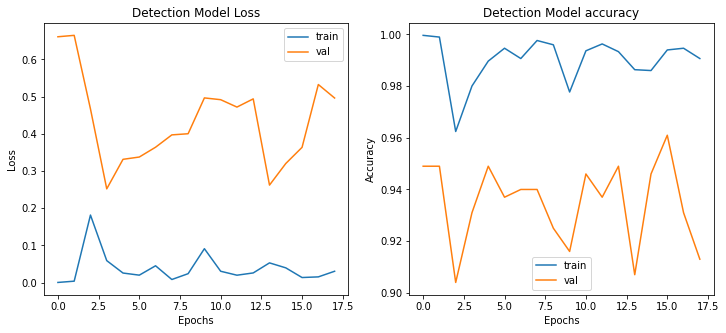

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("Detection Model Loss");
plt.ylabel("Loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['recall_3']);
plt.plot(h.history['val_recall_3']);
plt.title("Detection Model accuracy");
plt.ylabel("Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

Here, the term 'accuracy' in the plot, actually refers to the model recall.

## Saving the model:

In [ ]:
model.save("/content/drive/MyDrive/models/recall-adjusted_tumor_classifier_model")

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



INFO:tensorflow:Assets written to: /content/drive/MyDrive/models/recall-adjusted_tumor_classifier_model/assets


## Performance of saved model

In [ ]:
loaded_adj_tumor_detector = load_model('/content/drive/MyDrive/models/recall-adjusted_tumor_classifier_model')
loaded_adj_tumor_detector.compile(loss = 'binary_crossentropy', 
              optimizer='adam', 
              metrics= [tf.keras.metrics.Recall()])

In [ ]:
test_preds = loaded_adj_tumor_detector.predict(test_generator,verbose = 1) 

# We need to extract the class with highest prediction confidence for each sample
pred_classes = [] 
for i in test_preds: 
  pred_classes.append(str(np.argmax(i)))
pred_classes = np.asarray(pred_classes)


# Also extract ground truth values to evaluate model perfomance on test data
true_classes = np.asarray(test_mri_data['tumor'])


# Get the accuracy of model predictions
detector_accuracy = accuracy_score(true_classes, pred_classes)
print("Accuracy of detection is ",detector_accuracy)

# Get the precision,recall and f1_score
from sklearn.metrics import classification_report

report = classification_report(true_classes, pred_classes, labels = [0,1])
print(report)

37/37 [==============================] - 212s 5s/step
Accuracy of detection is  0.9694915254237289
              precision    recall  f1-score   support

           0       0.98      0.97      0.98       366
           1       0.95      0.97      0.96       224

   micro avg       0.97      0.97      0.97       590
   macro avg       0.97      0.97      0.97       590
weighted avg       0.97      0.97      0.97       590



/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:576: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Thus we are able to achieve a better recall value while also not trading accuracy off.

We will also see the performance of the Checkpointed Model.

## Peformance of checkpointed model:

Save architecture:

In [ ]:
model_json = model.to_json()
with open("/content/drive/MyDrive/models/recall_tumor_classifier_model_arch.json","w") as json_file:
  json_file.write(model_json)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



Load architecture and set weights

In [ ]:
with open('/content/drive/MyDrive/models/recall_tumor_classifier_model_arch.json', 'r') as json_file:
    json_savedModel= json_file.read()


best_adj_model = tf.keras.models.model_from_json(json_savedModel)
best_adj_model.load_weights("/content/drive/MyDrive/models/recall-clf-resnet-weights.hdf5")

Make predictions and evaluate

In [ ]:
best_test_preds = best_adj_model.predict(test_generator,verbose = 1) 
best_pred_classes = [] 
for i in best_test_preds: 
  best_pred_classes.append(str(np.argmax(i)))
best_pred_classes = np.asarray(best_pred_classes)

true_classes = np.asarray(test_mri_data['tumor'])
accuracy = accuracy_score(true_classes, best_pred_classes)
print("Accuracy is ",accuracy)

rep = classification_report(true_classes,best_pred_classes, labels=[0,1])
print(rep)

37/37 [==============================] - 2s 64ms/step
Accuracy is  0.9694915254237289
              precision    recall  f1-score   support

           0       0.98      0.97      0.98       366
           1       0.95      0.97      0.96       224

   micro avg       0.97      0.97      0.97       590
   macro avg       0.97      0.97      0.97       590
weighted avg       0.97      0.97      0.97       590



/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:576: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Here too, we are able to achieve **better recall value while also maintaining a high accuracy**

We shall stop with model tweaking process here and use the best model we currently have.

Note: Further effort could be made to improve the model's performance, by tuning the hyperparameters and tweaking the model structure.

# Model for semantic segmentation of the Brain Tumor region

Now that we are able to detect the presence of Brain Tumor with a high accuracy, we move on to segmentation of the tumor regions in the brain.

Like, during data visualization, where the mask image showed us the region of Brain Tumor

Given the MRI image of a human brain, we not only want to detect Brain Tumor, but also, for tumor positive samples ,segment(and show) the region of the tumor.

In other words, for every input MRI image, the output mask is a grayscale image of size (256,256).

<b>The model's job is to predict the value of each pixel value in the output mask image.</b>

Regions of tumor will have a pixel value close to 255(white foreground pixels).

## The ResUNet Model

For the semantic segmentation task, we shall make use of the ResUNet model.

ResUNet model:
https://arxiv.org/abs/1904.00592

It is an improvement over the existing UNET architecture

Its architecture comprises of an Encoder(contracting path), followed by a Decoder(expanding path) with a bottleneck in between, and short paths between each stage of encoder and decoder.

<img src="https://idiotdeveloper.com/wp-content/uploads/2021/02/arch.png" />

This model also uses residual blocks which were discussed while explaining the ResNet50 architecture. 

**At each stage of Encoder, the output is sent downward to the next stage and also to the adjacent Decoder stage.**

## Getting data ready

Our pipeline will be designed such that, only if the detector model isn't absolutely sure that there is no Brain Tumor, then it is fed to the Segmentation model.

There is no use in sending samples that have been confidently predicted as tumor negative, to the segmentation task.

### Extract only the samples with tumor

In [ ]:
df_copy[df_copy['tumor'] == '1']

,image_path,mask_path,tumor
445,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
507,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
551,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
555,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
617,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
...,...,...,...
3785,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
3795,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
3797,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1
3806,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1


In [ ]:
seg_data = df_copy[df_copy['tumor'] == '1']
seg_data.shape

(1373, 3)

In [ ]:
seg_data['tumor'] = seg_data['tumor'].astype('float32')
seg_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1373 entries, 445 to 3808
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_path  1373 non-null   object 
 1   mask_path   1373 non-null   object 
 2   tumor       1373 non-null   float32
dtypes: float32(1), object(2)
memory usage: 37.5+ KB


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Split the data

We'll use 85% of data for training the model, rest for validation and testing.

In [ ]:
seg_train,seg_test = train_test_split(seg_data, test_size = 0.15, random_state = 42)

seg_test, seg_val = train_test_split(seg_test, test_size = 0.5, random_state = 42)

print(seg_train.shape,seg_val.shape,seg_test.shape)


(1167, 3) (103, 3) (103, 3)


Create a list of Images(paths) and masks(paths).

The paths will be transformed to images after passing to the ImageData Generator

In [ ]:
train_images = list(seg_train['image_path'])
train_masks = list(seg_train['mask_path'])


val_images = list(seg_val['image_path'])
val_masks = list(seg_val['mask_path'])

print(len(train_images), len(val_images))

1167 103


In [ ]:
test_images = list(seg_test['image_path'])
test_masks = list(seg_test['mask_path'])

Now that we have the data ready, we need to define Image Data Generators.

Usually the target values passed to the Image Data Generator are labels such as 0 or 1.

Here the target is a mask image of shape (256,256,1)

So we'll try defining our own custom Image Data Generator.

### Custom Image Data Generator

In [ ]:
# Custom Image Data Generator class
class DataGen(tf.keras.utils.Sequence):
    # Set img dimension, batch_size etc.
    def __init__(self, imgs, masks, img_dir = './', batch_size = 64, img_h = 256, img_w = 256, shuffle = True):
        self.imgs = imgs
        self.masks = masks
        self.img_dir = img_dir
        self.batch_size = batch_size
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()
        
    def __len__(self):
        '''
        Return Number of batches per epoch
        '''
        return int(np.floor(len(self.imgs)) / self.batch_size)
    
    def __getitem__(self,index):
        '''
        Return a batch of image paths
        '''
        indexes = self.indexes[index* self.batch_size : (index+1)*self.batch_size]
        
        image_list = [self.imgs[i] for i in indexes]
        mask_list = [self.masks[i] for i in indexes]
        
        x,y = self.__data_generation(image_list, mask_list)
        
        return x,y
    
    
    def on_epoch_end(self):
        """
        Updating the indices after each epoch
        """
        
        self.indexes = np.arange(len(self.imgs))
        
        if self.shuffle:
            np.random.shuffle(self.indexes)
            
    
    def __data_generation(self,image_list,mask_list):
        '''
        Generate data corresponding to indexes in a given batch
        '''

        # image has 3 color channels
        x = np.empty((self.batch_size, self.img_h, self.img_w, 3))

        # mask is grayscale image
        y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

        for i in range(len(image_list)):
            img = io.imread(image_list[i])    # read mri image
            mask = io.imread(mask_list[i])    # read mask image

            img = cv2.resize(img,(self.img_h, self.img_w))
            img = np.array(img, dtype=np.float64)

            mask = cv2.resize(mask,(self.img_h, self.img_w))
            mask = np.array(mask, dtype= np.float64)

            # Standardize
            img -= img.mean()
            img /= img.std()

            mask -= mask.mean()
            mask /= mask.std()

            x[i,] = img
            # Reshaping mask from (256,256) to (256,256,1)
            y[i,] = np.expand_dims(mask, axis = 2)

        # normalize y
        y = (y > 0).astype(int)

        return x,y    

### Create Training and Validation ImageData Generators

In [ ]:
train_gen = DataGen(train_images, train_masks)

val_gen = DataGen(val_images, val_masks)

In [ ]:
train_gen.__len__()

18

In [ ]:
val_gen.__len__()

1

Through this we can check if our Custom Generator works correctly.

floor(Num training samples / Batch Size) = 1167 / 64 ≈ 18

floor(Num val sample / Batch Size) = 103 / 64 = 1 

So, our data is ready now.We shall start building the model.

## Brain Tumor Segmentation Model

We'll build the ResUNet model from scratch by defining residual blocks and adding some more layers.

In [ ]:
def resid_block(X, f):
  """
  Performs series of Convolutions, BatchNormalization, Relu on given data volums.
  Main Path:
    Input is processed with a series of convolutions,batch norms and relu activations.
    At the end output of shortcut path is concatenated and returned.
  Short Path:(Convolutional Version)
    Here, we don't actually perform that much learning, rather we use single convolution to resize the input 
    to be able to concatenate with output of main path.   
  """

  # Make a copy of X for processing and sending through Short Path
  X_copy = X


  # Main path
  # ('he_normal initializer' is used as Convolution Kernel initializer)

  X = Conv2D(f, kernel_size= (1,1), strides = (1,1), kernel_initializer='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)


  # Short path
  
  X_copy = Conv2D(f, kernel_size=(1,1), strides = (1,1), kernel_initializer='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)


  # Concatenate 
  X = Add()([X, X_copy])

  # Perform Relu activation on concatenated output
  X = Activation('relu')(X)

  return X

Decoder function to upscale input and concatenate values from Encoder part

In [ ]:
def upsample_and_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x,skip])

  return merge

### Building the Model

In [ ]:
inp_shape = (256,256,3)


x_input = Input(inp_shape)


# First Stage (Initial Processing)
conv1 = Conv2D(16, 3, activation='relu', padding = 'same', kernel_initializer='he_normal')(x_input)
conv1 = BatchNormalization()(conv1)
conv1 = Conv2D(16, 3, activation='relu', padding = 'same', kernel_initializer='he_normal')(conv1)
conv1 = BatchNormalization()(conv1)
pool1 = MaxPool2D(pool_size= (2,2))(conv1)


# Second Stage
conv2 = resid_block(pool1,32)
pool2 = MaxPool2D(pool_size=(2,2))(conv2)

# Third Stage
conv3 = resid_block(pool2,64)
pool3 = MaxPool2D(pool_size=(2,2))(conv3)

# Fourth Stage
conv4 = resid_block(pool3,128)
pool4 = MaxPool2D(pool_size=(2,2))(conv4)

# Fifth Stage  (Bottleneck)
conv5 = resid_block(pool4,256)


## Upscaling

## First Stage
up1 = upsample_and_concat(conv5, conv4)
up1 = resid_block(up1, 128)

## Second Stage
up2 = upsample_and_concat(up1, conv3)
up2 = resid_block(up2, 64)

## Third Stage
up3 = upsample_and_concat(up2, conv2)
up3 = resid_block(up3, 32)

## Fourth Stage
up4 = upsample_and_concat(up3, conv1)
up4 = resid_block(up4, 16)


# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = 'sigmoid')(up4)

"""
Note: sigmoid activation is used here , 
      since at the pixel level, the task is binary classification 
      i.e for every pixel, its value is either 0(white) or 1(black) in the mask image output
"""

seg_model = Model(inputs = x_input, outputs = output)

seg_model.summary()


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        batch_normalization[0][0]        
____________________________________________________________________________________________

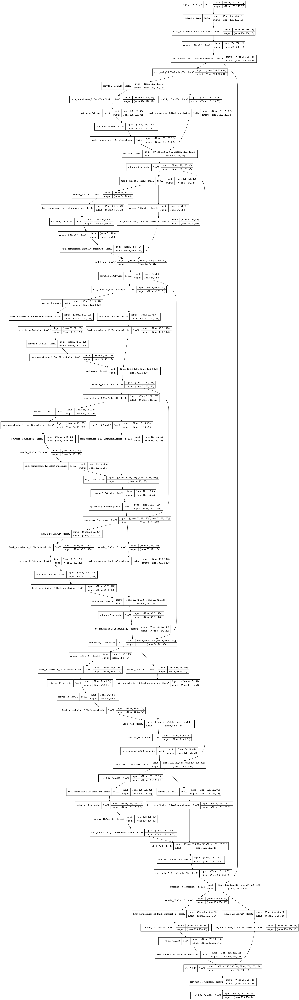

In [ ]:
plot_model(seg_model, to_file='/content/drive/My Drive/files/tumor_segmentation_model_arch.png',
           show_shapes=True,show_dtype=True,show_layer_names=True,expand_nested=True)

Now that our model structure is ready, we can proceed to the Training stage.

But before that, there is one thing we need to consider.

<b> The loss function to use for the task </b>

We could use crossentropy as the loss function, but there is a problem with that.

Intuitively, the job of the model we have built is to predict whether each of the pixel within a (256,256) mask image of the input, is more white or black.

The white(and similar to white) pixels clustered together represent the tumor region.

On closely observing the mask images in the training data, we can see that <b>only a very small portion of each mask image is white in color</b>
.Thus there is a **significant imbalance in distribution of the foreground and background pixels.**


If this imbalance is not taken care of, <b>the model will be biased towards background pixels (tend to predict most of the pixel values as black)</b>.This results in poor or bad performance of the model.

Imagine a person indeed has brain tumor, but the segmentation model predicts every pixel of the mask image to be black, thus predicting that the person has no tumor.That is a situation we would like to avoid.

For more info on this foreground-background (white pixel-black pixel) imbalance, refer 

<a href = "https://arxiv.org/abs/2001.02387">A context based deep learning approach for unbalanced medical image segmentation</a>

Research is going on, about accounting for this imbalance while training the model.The loss function can modified in such a way that the very high ratio of black pixels in the mask images does not detrimentally influence the model's learning process. 

One such loss function is the <a href = "https://github.com/nabsabraham/focal-tversky-unet"><b>focal-tversky-unet loss function</b></a>

@article{focal-unet,

  title={A novel Focal Tversky loss function with improved Attention U-Net for lesion segmentation},

  author={Abraham, Nabila and Khan, Naimul Mefraz},

  journal={arXiv preprint arXiv:1810.07842},

  year={2018}

}


We'll make use of this loss function to train our ResUNet model

We shall implement the tversky_loss function here

In [ ]:
from keras.losses import binary_crossentropy


smooth = 1

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

### Compiling the model

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon=0.1)

In [ ]:
seg_model.compile(optimizer=adam,
                  loss = focal_tversky,
                  metrics = [tversky])

### Model Callbacks

In [ ]:
early_stop = EarlyStopping(monitor='val_loss',
                           mode = 'min',
                           verbose = 1,
                           patience = 20)
check_point = ModelCheckpoint(filepath = "/content/drive/MyDrive/models/min_loss_tumor_segmenting_weights.hdf5",
                              verbose = 1,
                              save_best_only = True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              mode='min',
                              verbose=1,
                              patience=10,
                              min_delta=0.0001,
                              factor=0.2
                             )         # If the validation loss has plateaued over 10 epochs, we lower the learning rate

### Model Training

In [ ]:
h = seg_model.fit(train_gen,
                  epochs = 60,
                  validation_data = val_gen,
                  callbacks = [early_stop,check_point,reduce_lr])

Epoch 1/60
18/18 [==============================] - 601s 33s/step - loss: 0.9027 - tversky: 0.1274 - val_loss: 0.9148 - val_tversky: 0.1119

Epoch 00001: val_loss improved from inf to 0.91483, saving model to /content/drive/MyDrive/models/min_loss_tumor_segmenting_weights.hdf5


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



Epoch 2/60
18/18 [==============================] - 29s 2s/step - loss: 0.8536 - tversky: 0.1902 - val_loss: 0.9055 - val_tversky: 0.1240

Epoch 00002: val_loss improved from 0.91483 to 0.90549, saving model to /content/drive/MyDrive/models/min_loss_tumor_segmenting_weights.hdf5
Epoch 3/60
18/18 [==============================] - 18s 1s/step - loss: 0.8155 - tversky: 0.2379 - val_loss: 0.8623 - val_tversky: 0.1793

Epoch 00003: val_loss improved from 0.90549 to 0.86229, saving model to /content/drive/MyDrive/models/min_loss_tumor_segmenting_weights.hdf5
Epoch 4/60
18/18 [==============================] - 14s 788ms/step - loss: 0.7352 - tversky: 0.3359 - val_loss: 0.8383 - val_tversky: 0.2096

Epoch 00004: val_loss improved from 0.86229 to 0.83826, saving model to /content/drive/MyDrive/models/min_loss_tumor_segmenting_weights.hdf5
Epoch 5/60
18/18 [==============================] - 14s 760ms/step - loss: 0.5830 - tversky: 0.5123 - val_loss: 0.8202 - val_tversky: 0.2322

Epoch 00005: va

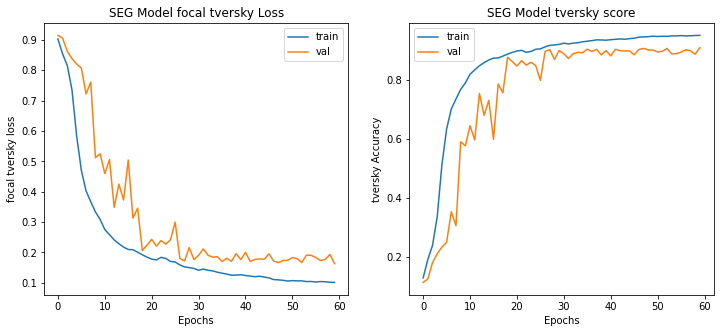

In [ ]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(h.history['loss']);
plt.plot(h.history['val_loss']);
plt.title("SEG Model focal tversky Loss");
plt.ylabel("focal tversky loss");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

plt.subplot(1,2,2)
plt.plot(h.history['tversky']);
plt.plot(h.history['val_tversky']);
plt.title("SEG Model tversky score");
plt.ylabel("tversky Accuracy");
plt.xlabel("Epochs");
plt.legend(['train', 'val']);

## Save the model:

In [ ]:
seg_model.save("/content/drive/MyDrive/models/tumor_segmentation_model")

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



INFO:tensorflow:Assets written to: /content/drive/MyDrive/models/tumor_segmentation_model/assets


## Load the saved model, make predictions and assess:

In [ ]:
loaded_seg_model = load_model("/content/drive/MyDrive/models/tumor_segmentation_model", compile = False)
loaded_seg_model.compile(optimizer=adam,
                  loss = focal_tversky,
                  metrics = [tversky])

In [ ]:
test_ids = list(seg_test.image_path)
test_mask = list(seg_test.mask_path)
test_data = DataGen(test_ids, test_mask)
_, seg_tv = loaded_seg_model.evaluate(test_data)
print("Segmentation tversky is {:.2f}%".format(seg_tv*100))

1/1 [==============================] - 31s 31s/step - loss: 0.1029 - tversky: 0.9518
Segmentation tversky is 95.18%


## Performance of Checkpointed Model:

We need the skeleton of the model structure:

In [ ]:
seg_model_json = seg_model.to_json()
with open("/content/drive/MyDrive/models/tumor_segmentation_model_arch.json","w") as json_file:
  json_file.write(seg_model_json)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning:

Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.



Load the model architecture, set its weights and evaluate the model's predictions

In [ ]:
with open('/content/drive/MyDrive/models/tumor_segmentation_model_arch.json', 'r') as json_file:
    json_savedModel= json_file.read()


best_model = tf.keras.models.model_from_json(json_savedModel)
best_model.load_weights("/content/drive/MyDrive/models/min_loss_tumor_segmenting_weights.hdf5")

best_model.compile(optimizer=adam,
                  loss = focal_tversky,
                  metrics = [tversky])

test_ids = list(seg_test.image_path)
test_mask = list(seg_test.mask_path)
test_data = DataGen(test_ids, test_mask)
_, tv = best_model.evaluate(test_data)
print("Segmentation tversky is {:.2f}%".format(tv*100))    


1/1 [==============================] - 3s 3s/step - loss: 0.1177 - tversky: 0.9423
Segmentation tversky is 94.23%


As the Saved Model has a higher tversky score(model metric), we shall use it in our prediction pipeline.

Thus we have trained the Brain Tumor Segmentation model and are able to successfully save and reconstruct it.

# Putting it all together

Now that we have the models to both detect and segment(out) brain tumor, we shall make and visualize predictions on the test data, through a combination of both the models.

As said earlier, if the tumor detection model is absolutely sure that no tumor is present, then we needn't send the image for segmentation further.

If the detector model is not too confident about a decision, the image can be sent to segmentation, and then a decision can be made using the final result.
(if segmentation model predicts every mask pixel as black, then no tumor, else tumor is present)


## Functionising the model pipeline:

Let us define a function to perform the above task.

In [ ]:
def make_prediction(test_data, detector_model, segmentation_model):
  """
    Gets dataframe of image paths and mask paths as input.
    First tries to detect Brain Tumor.
    If it makes very confident prediction that no tumor is present, segmentation part is skipped.
    Else decision is made after looking at predictions from segmenation model.
    Returns dataframe with fields for image_path, has_mask, predicted_mask
  """

  mask = []
  image_path = []
  has_mask = []

  for path in test_data.image_path:
    img = io.imread(path)
    # Normalize
    img = img * 1./255.
    # Resize
    img = cv2.resize(img,(256,256))

    img = np.array(img, dtype=np.float64)

    # Reshape to look like a batch of data,bacause that is what the model will expect
    img = np.reshape(img, (1,256,256,3))

    # Make prediction on image to detect tumor
    has_tumor = detector_model.predict(img)

    if np.argmax(has_tumor) == 0:
      # means model is absolutely sure no brain tumor is present, skip segmentation part
            image_path.append(path)
            has_mask.append(0)
            mask.append('No mask')
            continue
    # Means Detector is not entirely sure that there is 'No Brain Tumor'
    img = io.imread(path)

    # Model expects data in batches
    X = np.empty((1,256,256,3))

    img = cv2.resize(img,(256,256))
    img = np.array(img, dtype=np.float64)

    img -= img.mean()
    img /= img.std()

    # pass batch with single image to segmentation model for prediciton
    X[0,] = img

    seg_prediction = segmentation_model.predict(X)

    if seg_prediction.round().astype(int).sum() == 0:
      # mask image is completely black
      image_path.append(path)
      has_mask.append(0)
      mask.append('No mask')
    else:
      # some region has been identified
      image_path.append(path)
      has_mask.append(1)
      mask.append(seg_prediction)
  
  # Merge the predictions dataframe with images paths dataframe to make visualization task easier
  return pd.merge(test_data,
                  pd.DataFrame({'image_path':image_path, 'predicted_mask':mask, 'has_mask':has_mask}),
                  on="image_path")

## Test the working of the model prediction pipeline

In [ ]:
df_preds = make_prediction(test_mri_data, loaded_adj_tumor_detector, loaded_seg_model)
df_preds

,image_path,mask_path,tumor,predicted_mask,has_mask
0,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1,"[[[[3.360932e-05], [7.5873936e-06], [1.1398535...",1
1,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0,No mask,0
2,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0,No mask,0
3,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0,No mask,0
4,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0,No mask,0
...,...,...,...,...,...
585,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0,No mask,0
586,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0,No mask,0
587,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,0,No mask,0
588,/content/drive/MyDrive/data/brain_scans/files/...,/content/drive/MyDrive/data/brain_scans/files/...,1,"[[[[3.684919e-05], [5.791174e-06], [1.14182385...",1


Let us now define a function to visualize the predictions we just made.

It will be very similar to the data visualization functions we defined previously.

In [ ]:
def viz_prediction(preds, disp=15, rand = 42):
  """
  Receives dataframe containing image data with predictions
  Plots the predictions made and also overlays them over input images.
  """
  count = 0
  fig, axs = plt.subplots(disp,5, figsize = (30,disp*5))

  df = preds.copy()
  df = df.sample(frac=1, random_state=rand).reset_index(drop=True)
  print(df.shape)
  for i in range(len(df)):
    # display mri image
    img = io.imread(df.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].imshow(img)
    axs[count][0].title.set_text('Brain MRI')

    # display original mask
    mask = io.imread(df.mask_path[i])
    axs[count][1].imshow(mask)
    axs[count][1].title.set_text('Actual Mask')

    # display predicted mask if tumor positive
    if df.has_mask[i] == 1:
      pred_mask = np.array(df.predicted_mask[i]).squeeze().round()
    else:   # means mask will be completely dark
      pred_mask = np.ones(shape=(256,256),dtype = np.float32) * 255
    axs[count][2].imshow(pred_mask)
    axs[count][2].title.set_text('Predicted Mask')


    # Overlay actual Mask with MRI
    img[mask==255] = (255,0,0)
    axs[count][3].imshow(img)
    axs[count][3].title.set_text('Brain MRI with original mask')

    # Overlay predicted mask over MRI
    img_ = io.imread(df.image_path[i]) 
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    if df.has_mask[i] == 1:
      img_[pred_mask == 1] = (0,255,150)
    axs[count][4].imshow(img_)
    axs[count][4].title.set_text('Brain MRI with predicted Mask')

    count += 1
    if count == disp:
      break

  fig.tight_layout()
  plt.show()
  plt.savefig('/content/drive/My Drive/files/brain_tumor_AI_predictions.png')

(590, 5)


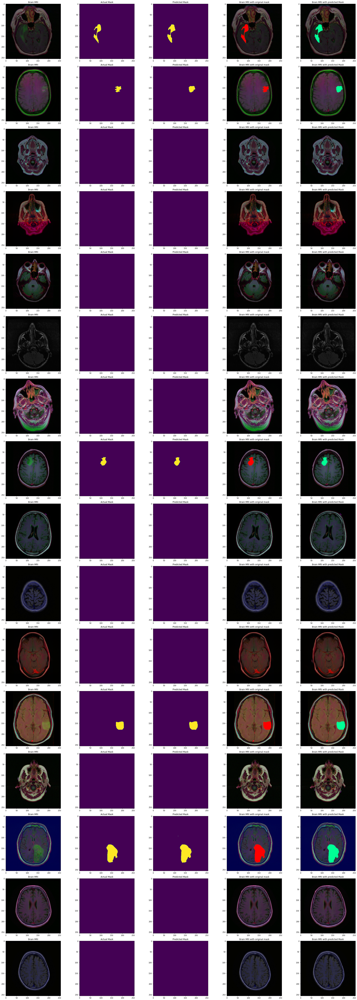

<Figure size 432x288 with 0 Axes>

In [ ]:
viz_prediction(df_preds,16)

Let's try to visualize some more predictions.

(590, 5)


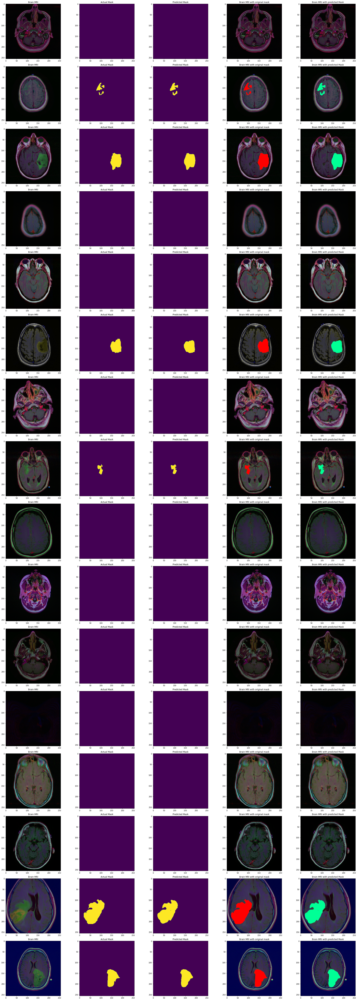

<Figure size 432x288 with 0 Axes>

In [ ]:
viz_prediction(df_preds,16,rand=43)

As we can see, the model pipeline performs a very good job of detecting Brain Tumor and segmenting the tumor regions as mask images, which are very similar to the actual mask images.

Thus we are able to successfully detect Brain Tumor from a person's MRI scan image and also perform semantic segmentation on Tumor Positive scan images.